# ПРОЕКТ: Исследование рынка заведений общественного питания Москвы

**Цели**: Проанализировать рынок заведений общественного питания Москвы, выявить особенности рынка, выработать рекомендации для выбора подходящего инвесторам места для новой кофейни.

**Исследуемые данные**: Для исследования представлен датасет с данными о 8406 заведениях общественного питания г. Москвы по состоянию на лето 2022 года, который содержит следующие данные:   
**name** — название заведения;   
**address** — адрес заведения;   
**category** — категория заведения;   
**hours** — информация о днях и часах работы;    
**lat** и **lng** — широта и долгота географической точки, в которой находится заведение;   
**rating** — рейтинг заведения по оценкам пользователей;   
**price** — категория цен в заведении;    
**avg_bill** — средняя стоимость заказа (в виде диапозона);   
**middle_avg_bill** — средний чек заведения;     
**middle_coffee_cup** — средняя стоимость одной чашки капучино;    
**chain** — тип заведения (0 - несетевое, 1 - сетевое);    
**district** — административный район, в котором находится заведение;   
**seats** — количество посадочных мест.

**Задачи**:    
- Выполнить предобработку данных (проверить наличие дубликатов и попущенных данных, добавить новые столбцы с необходимыми данными, исправить ошибки);   
- Исследовать рынок общественного питания г. Москвы по разным параметрам (по категориям, районам, рейтингам, режимы работы и др.), выявить наличие особенностей, закономерностей;   
- Детально исследовать рынок кофеен г. Москвы, установить наличие особенностей для данной категории заведений;   
- Сформировать рекомендации инвесторам для открытия новой кофейни.

<a id='part-0'></a>
## СОДЕРЖАНИЕ 
[1. Используемые данные](#part-1)  
[2. Предобработка данных для анализа](#part-2)     
[2.1. Обработка дубликатов](#part-2-1)     
[2.2. Обработка пропущенных данных](#part-2-2)      
[2.3. Преобразование типа данных датасета](#part-2-3)    
[2.4. Предобработка формата датасета](#part-2-4)   
[2.4.1. Добавление новых столбцов](#part-2-4-1)   
[2.4.2. Исправление ошибочных данных](#part-2-4-2)   
[3. Исследование рынка общественного питания г. Москвы](#part-3)     
[3.1. Исслодование категорий заведений](#part-3-1)    
[3.2. Исследование заведений по признаку "сетевое/несетевое"](#part-3-2)        
[3.3. Исследование заведений по районам](#part-3-3)        
[3.4. Исследование рейтинга заведений](#part-3-4)        
[3.5. Исследование географического расположения заведений](#part-3-5)        
[3.6. Исследование среднего чека заведений](#part-3-6)        
[3.7. Иследование режима работы заведений ](#part-3-7)     
[3.8. Исследование категорий цен заведений ](#part-3-8)     
[4. Исследование рынка кофеен г. Москвы](#part-4)    
[5. Общий вывод](#part-5) 

<a id='part-1'></a>
### 1. Используемые данные

In [1]:
# Осуществляем импорт необходимых библиотек.
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import datetime as dt
from datetime import datetime, timedelta 
import time
import json
from folium import Map,Choropleth
from folium.plugins import MarkerCluster
from folium import Marker, Map
import ipywidgets as widgets
from IPython.display import display
from os.path import isfile

In [2]:
# открываем датасет
try:
    data = pd.read_csv('/home/csv')
except FileNotFoundError:
    data = pd.read_csv('/datasets.csv')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**ВЫВОД**: В представленном датасете содержатся данные о 8406 заведениях общественного питания г. Москвы. Из 14 столбцов датасета только 8 имеют полные данные. Остальные столбцы содержат строки с пропущенными данными, что требует дополнительного анализа и предобработки. Столбцы name, category, address, district, hours, price, avg_bill содержать данные типа object, что соответствует их содержимому. Данные в столбцах lat, lng, rating, middle_avg_bill, middle_coffee_cup указаны в формате float64, что также соответствует назначению данных столбцов и позволит выполнять с этими данными необходимые действия. В свою очередь, столбец seats с данными о количестве посадочных мест (т.е. о количестве целых предметов) содержит данные в формате float64. Тип данных этого столбца целесообразно заменить на int64.

<a id='part-2'></a>
## 2. Предобработка данных для анализа
[содержание](#part-0)

<a id='part-2-1'></a>
### 2.1. Обработка дубликатов

In [5]:
# Приведем названия заведений к нижнему регистру
data['name'] = data['name'].str.lower()
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [6]:
# Проверим датасет на наличие дубликатов
data.duplicated().sum()

0

In [7]:
# Выполним поиск дубликатов по группе признаков: name и  address.
duplicated=data.fillna(-999).groupby(['name', 'address'])['name'].count().sort_values(ascending=False).to_frame()\
.rename(columns={'name': 'count'}).reset_index().query('count>1')
duplicated

,name,address,count
0,хлеб да выпечка,"Москва, Ярцевская улица, 19",2
1,раковарня клешни и хвосты,"Москва, проспект Мира, 118",2
2,more poke,"Москва, Волоколамское шоссе, 11, стр. 2",2


Датасет содержит продублированные данные по трем заведениям.

In [8]:
# Создадим список с названиями продублированных заведений
list_duplicated = list(duplicated['name'])
# Проверим какие данные о заведениях из этого списка есть в датасете
data.query('name in @list_duplicated')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0
6088,more poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN
7270,раковарня клешни и хвосты,"бар,паб","Москва, Братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.659744,37.752984,4.9,средние,Цена бокала пива:150–250 ₽,NaN,NaN,1,40.0
7937,хлеб да выпечка,кофейня,"Москва, Каширское шоссе, 61Г",Южный административный округ,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,NaN,NaN,NaN,NaN,1,NaN


В датасете имеются дубликаты (по имени и адресу) с данными о заведениях, которые являются сетевыми (т.е. представлены в количестве > 1). Однако, в строках с дубликатами указано, что данные заведения являются не сетевыми. Целесообразно удалить три строки с дубликатами.

In [9]:
# Создадим датафрейм с данными по заведениям, которые входят в список названий с дубликатами и не являются сетевыми
dupl_data = data.query('name in @list_duplicated & chain==0')

# Выбираем индексы строк, которые нужно удалить
index_to_drop = dupl_data.index

# Удаляем строки 
data = data.drop(index=index_to_drop)
# Проверяем удаление
data.query('name == "хлеб да выпечка"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
7937,хлеб да выпечка,кофейня,"Москва, Каширское шоссе, 61Г",Южный административный округ,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,NaN,NaN,NaN,NaN,1,NaN


В датасете остались только сетевые заведения из списка. Дубликаты по названию и адресу с неверным признаком chain удалены.

<a id='part-2-2'></a>
### 2.2.  Обработка пропущенных данных
[содержание](#part-0)

In [10]:
# определяем столбцы с пропущенными данных
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

In [11]:
# Проверим какие данные указаны в столбце 'price'
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [12]:
# Проверим какие данные указаны в столбце 'hours'
data['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [13]:
# Проверим какие данные указаны в столбце 'avg_bill'
data['avg_bill'].unique() 

array([nan, 'Средний счёт:1500–1600 ₽', 'Средний счёт:от 1000 ₽',
       'Цена чашки капучино:155–185 ₽', 'Средний счёт:400–600 ₽',
       'Средний счёт:199 ₽', 'Средний счёт:200–300 ₽',
       'Средний счёт:от 500 ₽', 'Средний счёт:1000–1200 ₽',
       'Цена бокала пива:250–350 ₽', 'Средний счёт:330 ₽',
       'Средний счёт:1500 ₽', 'Средний счёт:300–500 ₽',
       'Средний счёт:140–350 ₽', 'Средний счёт:350–500 ₽',
       'Средний счёт:300–1500 ₽', 'Средний счёт:от 240 ₽',
       'Средний счёт:200–250 ₽', 'Средний счёт:328 ₽',
       'Средний счёт:300 ₽', 'Средний счёт:от 345 ₽',
       'Средний счёт:60–400 ₽', 'Средний счёт:900 ₽',
       'Средний счёт:500–800 ₽', 'Средний счёт:500–1000 ₽',
       'Средний счёт:600–700 ₽', 'Цена бокала пива:120–350 ₽',
       'Средний счёт:1000–1500 ₽', 'Средний счёт:1500–2000 ₽',
       'Цена чашки капучино:150–190 ₽', 'Средний счёт:2000–2500 ₽',
       'Средний счёт:600 ₽', 'Средний счёт:450 ₽',
       'Цена чашки капучино:120–170 ₽', 'Средний счё

Исходя из текстового формата данных, содержащихся в столбцах 'hours', 'price', 'avg_bill', необходимо отсутствующие данные заменить на маркер "нет данных". Пропущенные данные 'middle_avg_bill', 'middle_coffee_cup', 'seats' (с числовыми данными) целесообразно заменить на ноль.

In [14]:
# Заменим пропущенные данные (NaN) в столбцах 'hours', 'price' и 'avg_bill' на маркер "нет данных" 
data[['hours', 'price', 'avg_bill']] = data[['hours', 'price', 'avg_bill']].fillna('нет данных') 

In [15]:
# Заменим отсутствующие данные в столбцах 'middle_avg_bill', 'middle_coffee_cup', 'seats' нулевыми значениями.
data[['middle_avg_bill', 'middle_coffee_cup', 'seats']] = data[['middle_avg_bill','middle_coffee_cup', 'seats']]\
.fillna(0) 
# Проверим выполнение замены данных
data.isna().sum()

name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
dtype: int64

После замены данных в датасете отсутствуют ячейки с пропущенными данными.

<a id='part-2-3'></a>
### 2.3. Преобразование типа данных датасета
[содержание](#part-0)

In [16]:
# Меняем тип данных float64 на int64 (целое число)
data['seats'] = data['seats'].astype(int)

# Проверяем изменения
data.info() 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8403 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              8403 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              8403 non-null   object 
 9   avg_bill           8403 non-null   object 
 10  middle_avg_bill    8403 non-null   float64
 11  middle_coffee_cup  8403 non-null   float64
 12  chain              8403 non-null   int64  
 13  seats              8403 non-null   int64  
dtypes: float64(5), int64(2), object(7)
memory usage: 984.7+ KB


<a id='part-2-4'></a>
### 2.4.  Предобработка формата датасета 
[содержание](#part-0)

<a id='part-2-4-1'></a>
### 2.4.1  Добавление новых столбцов 

In [17]:
# Добавим столбец с названиями улиц
data['street'] = data['address'].str.split(',', expand=True)[1]
data['street'].value_counts()

 проспект Мира                 183
 Профсоюзная улица             122
 проспект Вернадского          108
 Ленинский проспект            107
 Ленинградский проспект         95
                              ... 
 улица Маршала Соколовского      1
 Малый Казённый переулок         1
 улица Максимова                 1
 Басманный тупик                 1
 Чонгарский бульвар              1
Name: street, Length: 1448, dtype: int64

In [18]:
# В столбце 'is_24/7' логическое значение True будут иметь только заведения, работающие в режиме
# 'ежедневно, круглосуточно'. Для заполнения данного столбца создадим функцию 

""" Функция work_time при наличии в столбце 'hours' значения "ежедневно, круглосуточно", возвращает True,
при его отсутствии - False"""

def work_time(data):
 if data['hours'] == "ежедневно, круглосуточно":
  value = True
 else :
  value = False
 return value

# Применяем функцию work_time методом apply для создания нового столбца
data['is_24/7'] = data.apply (work_time, axis=1)
# Проверим результат 
data.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
7828,кафе,кафе,"Москва, МКАД, 30-й километр, 6",Южный административный округ,"ежедневно, круглосуточно",55.573942,37.637520,4.0,нет данных,нет данных,0.0,0.0,0,0,МКАД,True
6071,шоколадница,кофейня,"Москва, Комсомольский проспект, 29",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.725164,37.580159,4.3,нет данных,Цена чашки капучино:239–274 ₽,0.0,256.0,1,92,Комсомольский проспект,False
7853,люля-кебаб и шаурма,быстрое питание,"Москва, Шипиловский проезд, вл39с2",Южный административный округ,"ежедневно, круглосуточно",55.612670,37.695706,3.3,нет данных,нет данных,0.0,0.0,0,0,Шипиловский проезд,True
4177,campus,кафе,"Москва, Пречистенская набережная, 11",Центральный административный округ,"ежедневно, 08:30–20:00",55.737750,37.603496,4.2,средние,Средний счёт:250–500 ₽,375.0,0.0,1,0,Пречистенская набережная,False
6429,яндекс лавка,ресторан,"Москва, Вешняковская улица, 39Г",Восточный административный округ,"ежедневно, 07:00–00:00",55.718109,37.826103,4.1,нет данных,нет данных,0.0,0.0,1,25,Вешняковская улица,False


<a id='part-2-4-2'></a>
### 2.4.2  Исправление ошибочных данных 
[содержание](#part-0)

Посчитаем количество заведений с одинаковыми названиями и имеющими признак сетевого заведения. Здесь и далее под сетевым заведением понимается заведение, входящее в сеть, состоящую из 2 и более заведений.

In [19]:
# Создадим датасет с данными только о сетевых заведениях
chain_1 = data.query('chain == 1')
chain_1 = chain_1['name'].value_counts().to_frame().reset_index()
chain_1

,index,name
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
...,...,...
742,радуга,1
743,барбарис,1
744,пекарня № 1,1
745,чао-пицца,1


В полученной таблице имеются названия с количеством заведений равным одному, что говорит о том, что заведение не является сетевым. Для таких заведений необходимо выполнить замену признака chain с 1 на 0.

In [20]:
# Сформируем список заведений, представленных в единственном количестве.
single = chain_1.query('name == 1')
list_single = list(single['index'])
list_single

['роллофф',
 'suшi',
 'zafferano',
 'кофе пью',
 'миндаль',
 'bigсуши',
 'мясо на углях',
 'кинобар',
 'уйгурский лагман',
 'поминальная трапеза',
 'drive',
 'крепери',
 'парк',
 'home',
 'харчевниковъ',
 'хинкальная экспресс',
 'суши таун',
 'китчен',
 'ливан хаус',
 'чайхана хан',
 '1-я креветочная',
 'сказка',
 'чай',
 'баку',
 'ploveberry',
 'кофейник',
 'easy pizza',
 'vintage',
 'диана',
 'шашлыки',
 '4 сезона',
 'wаурма',
 'дастархан',
 'хинкали',
 'суши wok',
 'любовь и сладости',
 'tasty thai',
 'бюро пиццы',
 'городок',
 'прованс',
 'мореморе',
 'виолино',
 'бакинский дворик',
 'пивбар',
 'halal food',
 'в своей тарелке',
 'суши-пицца 312',
 'чайхана-24',
 'чабан чуду',
 'дайнинг холл',
 'bakery',
 'ricers',
 'лагман',
 'рома',
 'сириус',
 'пицца экспресс',
 'радуга',
 'барбарис',
 'пекарня № 1',
 'чао-пицца',
 'kimpab']

In [21]:
# Выполним замену значений с 1 на 0 в столбце chain у тех заведений, которые входят в список list_single
for i in list_single:
    data.loc[data['name'] == i, 'chain'] = 0
# Выполним проверку замены
data.query('name in @list_single')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
133,крепери,"бар,паб","Москва, улица Лескова, 14",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.897490,37.604722,4.0,нет данных,нет данных,0.0,0.0,0,0,улица Лескова,False
206,vintage,кафе,"Москва, Дмитровское шоссе, 163Ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.908956,37.540036,4.1,нет данных,нет данных,0.0,0.0,0,0,Дмитровское шоссе,False
382,halal food,кафе,"Москва, Петрозаводская улица, 34",Северный административный округ,"ежедневно, круглосуточно",55.867428,37.489429,4.4,средние,Средний счёт:200–400 ₽,300.0,0.0,0,30,Петрозаводская улица,True
613,wаурма,кафе,"Москва, улица Героев Панфиловцев, 1/2",Северо-Западный административный округ,нет данных,55.852060,37.438371,4.1,нет данных,нет данных,0.0,0.0,0,0,улица Героев Панфиловцев,False
745,в своей тарелке,столовая,"Москва, Локомотивный проезд, 21",Северный административный округ,нет данных,55.845414,37.573537,3.9,нет данных,нет данных,0.0,0.0,0,0,Локомотивный проезд,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7711,ploveberry,быстрое питание,"Москва, Варшавское шоссе, 140",Южный административный округ,"ежедневно, 10:00–22:00",55.611491,37.606900,4.2,нет данных,Средний счёт:300–400 ₽,350.0,0.0,0,0,Варшавское шоссе,False
7818,кофейник,кофейня,"Москва, Михневская улица, 2Д, стр. 4",Южный административный округ,"пн-пт 07:00–21:00; сб,вс 08:00–21:00",55.581907,37.660898,4.1,низкие,Средний счёт:140–142 ₽,141.0,0.0,0,0,Михневская улица,False
7874,suшi,пиццерия,"Москва, Каширское шоссе, 65, корп. 2",Южный административный округ,"пн-пт 11:00–22:15; сб,вс 11:00–23:00",55.600178,37.726182,4.8,нет данных,нет данных,0.0,0.0,0,100,Каширское шоссе,False
7899,роллофф,кафе,"Москва, Каширское шоссе, 142, корп. 1, стр. 5",Южный административный округ,"пн-чт 11:00–23:00; пт,сб 11:00–23:30; вс 11:00...",55.597524,37.723076,4.1,низкие,Средний счёт:400 ₽,400.0,0.0,0,80,Каширское шоссе,False


**ВЫВОД**: Из датасета исключены три строки с дубликатами. Пропущенные данные в столбцах 'hours', 'price', 'avg_bill' заменены на маркер "нет данных", а в столбцах 'middle_avg_bill', 'middle_coffee_cup', 'seats' - на ноль. В столбце 'seats' изменен тип данных с float64 на int64. Добавлены новые столбцы с данными: об улицах, на которых расположены заведения; о режиме работы (True - круглосуточно, False - некруглосуточно). Исправлены ошибки в части значений столбца chain  для заведений, представленных в единственном числе.

<a id='part-3'></a>
## 3. Исследование рынка общественного питания г. Москвы
[содержание](#part-0)

<a id='part-3-1'></a>
### 3.1. Исслодование категорий заведений
[содержание](#part-0)

In [22]:
# Создадим таблицу с данными о количестве заведений в каждой категории
category = data['category'].value_counts(ascending=True).to_frame().reset_index()\
.rename(columns={'index': 'категория', 'category': 'кол-во заведений'})\
.sort_values(by='кол-во заведений', ascending = False)\
.reset_index(drop=True)
category['percent'] = (category['кол-во заведений']\
                                        / category['кол-во заведений'].sum())\
.map(lambda x: '{0:.2%}'.format(x))

# Строим диаграмму
fig = px.bar(category.sort_values(by='кол-во заведений', ascending=False),
             x='категория', 
             y='кол-во заведений', 
             text='percent',
             color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_layout(title='Распределение заведений по категориям',
                  xaxis_title='Категория заведений', 
                  yaxis_title='Количество заведений')
fig.show()

В датасете содержатся данные о восьми категориях заведений. Самыми большими категориями являются "кафе" (2378) и "ресторан" (2043). Третье место занимает категория "кофейня", их 1413. Оставльные категории представлены менее чем 1000 заведений в каждой категории.

In [23]:
# Создадим таблицу с данными о среднем (медианном) количестве мест для каждой категории заведений
# Для группировки не используем строки с пропущенными данными о количестве мест,
# в которых ранее была выполнена замена на 0.

seats = data.query('seats != 0').groupby('category')['seats'].median().sort_values(ascending=False)\
.round().astype(int).to_frame().reset_index()
# Строим диаграмму
fig = px.bar(seats.sort_values(by='seats', ascending=False),
             x='category', 
             y='seats', 
             text='seats',
             color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_layout(title='Среднее количество посадочных мест в заведениях по категориям',
                  xaxis_title='Категория заведений', 
                  yaxis_title='Среднее количество посадочных мест')
fig.show()

Больше всего посадочных мест (в среднем) в ресторанах и барах. Меньше всего посадочных мест в пицерриях и булочных. Остальные категории имеют от 60 до 80 посадочных мест.

<a id='part-3-2'></a>
### 3.2. Исследование заведений по признаку "сетевое/несетевое"
[содержание](#part-0)

Под "сетевым" понимается заведение, входящее в сеть, состоящую из двух и более заведений.    
"Несетевым" является заведение представленное на рынке общественного питания г. Москвы в единственном числе.

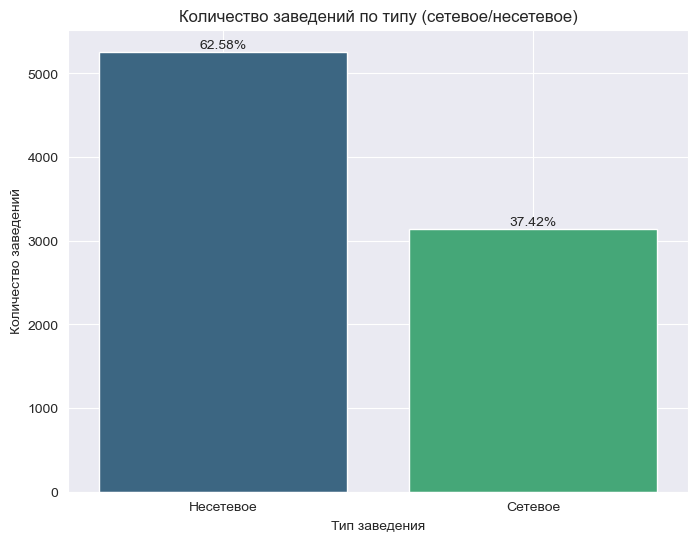

In [24]:
# Сгруппируем названия заведений по признаку сетевое/несетевое, посчитаем количество в каждой группе
chain = data.groupby('chain').agg({'name':'count'}).reset_index()\
.rename(columns={'chain': 'Тип заведения', 'name': 'Кол-во заведений'})

# Построим диаграмму 
sns.set_style('dark')
plt.figure(figsize=(8, 6))
ax = sns.barplot(x='Тип заведения', y='Кол-во заведений', data=chain, palette='viridis')
plt.title('Количество заведений по типу (сетевое/несетевое)')
plt.xlabel('Тип заведения')
plt.ylabel('Количество заведений')
plt.grid()
# Добавим проценты на столбцах графика
for i, row in chain.iterrows():
    percentage = round(100 * row['Кол-во заведений'] / chain['Кол-во заведений'].sum(), 2)
    ax.text(i, row['Кол-во заведений'], f'{percentage}%', ha='center', va='bottom')
ax.set_xticklabels(['Несетевое', 'Сетевое'])
plt.show()

В представленном датасете большая часть заведений являются несетевыми (0). Сетевых (1) заведений почти в полтора раза меньше.

Исследуем распределение заведений на сетевые/несетевые по категориям.

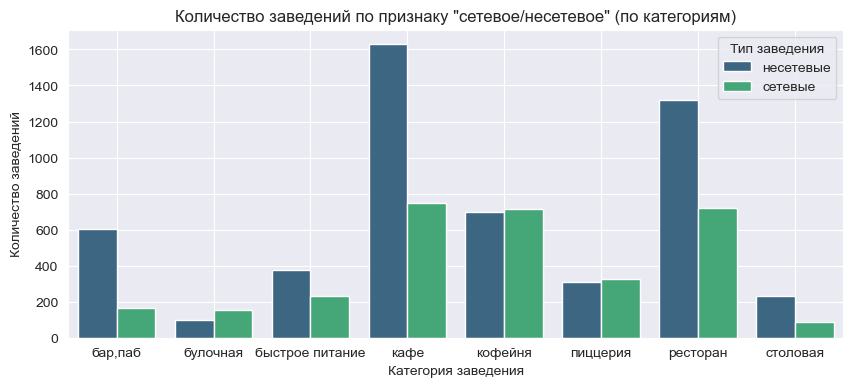

In [25]:
# Создадим таблицу с данными о количестве заведений по типу (сетевое/несетевое) по категориям
category_chain= data.groupby(['category', 'chain'], \
                        as_index = False)[['name']].count()
category_chain['chain'] = category_chain['chain'].replace({0: 'несетевые', 1: 'сетевые'})

# Построим диаграмму
sns.set_style('dark')
plt.figure(figsize=(10, 4))
sns.barplot(x='category', y='name', data=category_chain, hue='chain', palette='viridis')
plt.title('Количество заведений по признаку "сетевое/несетевое" (по категориям)')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.legend(title='Тип заведения')
plt.grid()
plt.show()

Чаще всего сетевыми являются заведения категории "кафе", "кофейня", "ресторан". Реже сетевыми являются столовые и булочные.

In [26]:
# Создадим таблицу с данными о ТОР-15 сетевых заведений, о количестве заведений в них и их категориях.
name = data.query('chain == 1').groupby('name').agg({'address':'count', 'category':'unique'}).reset_index()\
.rename(columns={'name':'Название', 'address': 'Кол-во заведений', 'category':'Категория'})\
.sort_values(by='Кол-во заведений', ascending=False).head(15)
pd.set_option('display.max_colwidth', None)
name

,Название,Кол-во заведений,Категория
668,шоколадница,120,"[кофейня, кафе]"
309,домино'с пицца,76,[пиццерия]
305,додо пицца,74,[пиццерия]
137,one price coffee,71,[кофейня]
681,яндекс лавка,69,[ресторан]
54,cofix,65,[кофейня]
158,prime,50,"[ресторан, кафе]"
610,хинкальная,44,"[быстрое питание, кафе, ресторан, столовая, бар,паб]"
379,кофепорт,42,[кофейня]
387,кулинарная лавка братьев караваевых,39,[кафе]


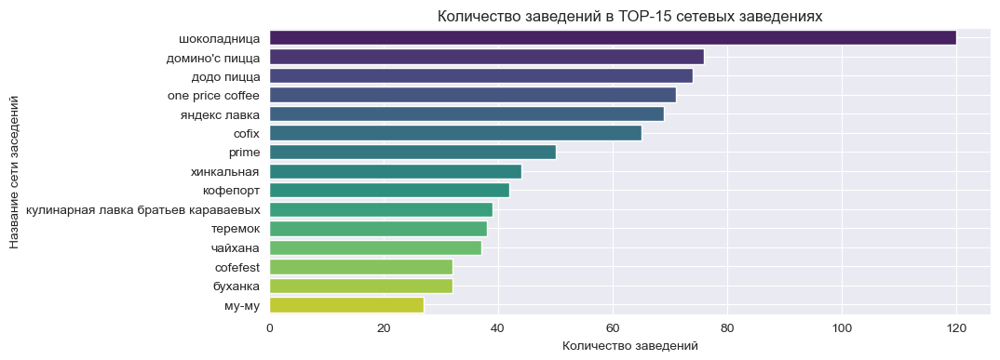

In [27]:
# Построим диаграмму с данными о ТОР-15 сетевых заведениях
sns.set_style('dark')
plt.figure(figsize=(10, 4))
sns.barplot(x='Кол-во заведений', y='Название', data=name, palette='viridis')
plt.title('Количество заведений в ТОР-15 сетевых заведениях')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети заседений')
plt.grid()
plt.show()

Самая популярная сеть заведений - "Шоколадница"(категории "кафе", "кофейня"), представлена на рынке 120 заведениями. На 2м и 3м местах пиццерии - "Домино'с Пицца" и "Додо Пицца". Список ТОР-15 представлен известными на рынке сетями общественного питания (пиццерии, кофейни, готовое питание). В целом их можно охарактеризовать как заведения с высокой проходимостью и быстрой скоростью обслуживания.

<a id='part-3-3'></a>
### 3.3. Исследование заведений по районам
[содержание](#part-0)

Под районами в настоящем проекте понимаются административные округа г. Москвы.

In [28]:
# Создадим таблицу с данными о количестве заведений по районам
district_data = data.groupby('district').agg({'name':'count'}).reset_index()\
.rename(columns={'district':'Район', 'name': 'Кол-во'})\
.sort_values(by='Кол-во', ascending=False)\
.reset_index(drop=True)
district_data['percent'] = (district_data['Кол-во']\
                                        / district_data['Кол-во'].sum())\
.map(lambda x: '{0:.2%}'.format(x))

# Строим диаграмму
fig = px.bar(district_data.sort_values(by='Кол-во', ascending=True),
             x='Кол-во', 
             y='Район', 
             text='percent',
             color_discrete_sequence=['#3b528b'])
fig.update_layout(title='Количество заведений по районам',
                  xaxis_title='Количество заведений', 
                  yaxis_title='Район')
fig.show()

В датасете представлены данные по 9 районам г. Москвы. Больше всего заведений в Цетральном административном округе, меньше заведений в Северо-Западном административном округе.

In [29]:
# Создадим таблицу с данными о количестве заведений в районах по категориям
category_by_district=data.groupby(['district', 'category']).agg({'name':'count'})\
.reset_index()\
.rename(columns={'district': 'Районы', 'category': 'Категория', 'name':'Кол-во заведений'})\
# Построим диаграмму 
fig = px.bar(category_by_district,  y='Районы', x='Кол-во заведений', color='Категория',\
             width=1000, height=500,\
               title="Количество заведений в районах по категориям",\
             color_discrete_sequence=px.colors.sequential.Viridis)
fig.show()


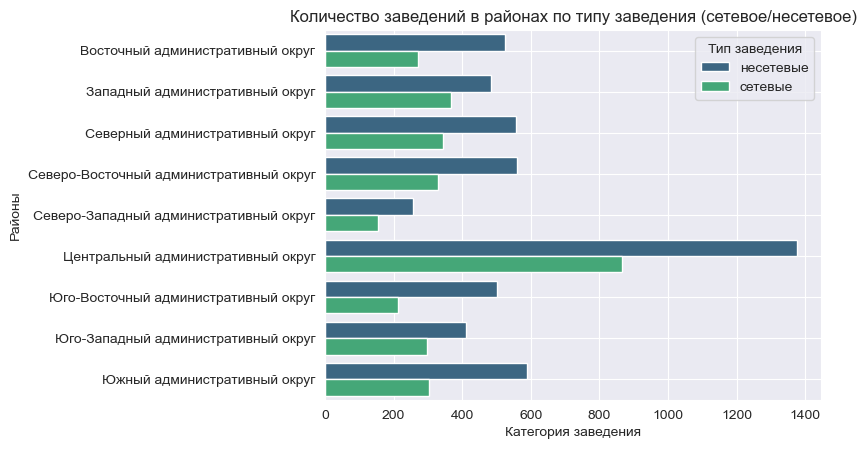

In [30]:
# Создадим таблицу с данными о количестве заведений в районах в зависимости от типа заведения
district_chain_cafe=data.pivot_table(index=['district', 'chain'], values='name',\
                                     aggfunc='count').reset_index()
district_chain_cafe['chain'] = district_chain_cafe['chain']\
.replace({0: 'несетевые', 1: 'сетевые'})

# Построим диаграмму
sns.set_style('dark')
sns.barplot(x='name', y='district', data=district_chain_cafe, hue='chain', palette='viridis')
plt.title('Количество заведений в районах по типу заведения (сетевое/несетевое)')
plt.xlabel('Категория заведения')
plt.ylabel('Районы')
plt.legend(title='Тип заведения')
plt.grid()
plt.show()

Больше всего выделяется Центральный АО: в нем больше всего заведений (почти в 2 раза больше, чем в любом другом районе). Это может объясняться тем, что в данном районе большое количество деловых центров, офисных учреждений, развлекательных мест, туристических достопримечательностей, что обеспечивает большой поток посетителей, и как следствие большой строс на места общественного питания. В Центральном и Западном округах преобладают сетевые заведения.

<a id='part-3-4'></a>
### 3.4. Исследование рейтинга заведений
[содержание](#part-0)

In [31]:
# Создадим таблицу с данными о среднем рейтинге заведений в зависимости от категории
rating_by_category = data.groupby('category').agg({'rating':'mean'}).round(2).reset_index()

# строим столбчатую диаграмму
fig = px.bar(rating_by_category.sort_values(by='rating', ascending=True),
             x='category', 
             y='rating', 
             text='rating',
             color_discrete_sequence=['#21918c'])
fig.update_layout(title='Средний рейтинг заведений по категориям',
                  xaxis_title='Категория заведений', 
                  yaxis_title='Средний рейтинг заведения')
fig.show() 

Средний рейтинг заведений по категориям колеблится от 4,05 до 4,39 балла, что является несущественным различием между категориями. В связи с этим, можно утверждать, что усреднённые рейтинги в разных типах общепита не сильно отличаются друг от друга.

In [32]:
# Создадим таблицу со средним рейтингом заведений в районах
rating_by_district = data.groupby('district').agg({'rating':'mean'}).round(2).reset_index()\
.rename(columns={'district': 'Районы', 'rating': 'Средний рейтинг'})\
.sort_values(by='Средний рейтинг', ascending=False)
rating_by_district

,Районы,Средний рейтинг
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [33]:
# Построим хороплет с данными о средних рейтингах по районам
# загружаем JSON-файл с границами районов

state_geo = ('/home/anna/Документы/ЯНДЕКС ПРАКТИКУМ/5. Визуализация данных/admin_level_geomap.geojson'
             if isfile('/home/anna/Документы/ЯНДЕКС ПРАКТИКУМ/5. Визуализация данных/admin_level_geomap.geojson')
             else '/datasets/admin_level_geomap.geojson')

# Определяем широту и долготу центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
district_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_by_district,
    columns=['Районы', 'Средний рейтинг'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Усреднённые рейтинги заведений по районам',
).add_to(district_map)

# выводим карту
district_map

<a id='part-3-5'></a>
### 3.5. Исследование географического расположения заведений
[содержание](#part-0)

In [34]:
# Отобразим все заведения датасета на карте с помощью кластеров.
# создаём карту Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(moscow_map)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
moscow_map

In [35]:
# Создадим таблицу с TOP-15 улиц по количеству заведений. 
count_by_streets = data.groupby('street').agg({'name':'count'}).reset_index()\
.sort_values(by='name', ascending=False)\
.rename(columns={'street':'Название улицы', 'name': 'Количество'})
top15_streets = count_by_streets.head(15)
top15_streets

,Название улицы,Количество
1090,проспект Мира,183
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [36]:
# Создадим список с названиями улиц TOP-15.

list_top15_streets = list(top15_streets['Название улицы'])
many_data = data.query('street == @list_top15_streets')

# Создадим таблицу с данными о количестве заведений в районах по категориям
category_by_streets=many_data.groupby(['street', 'category']).agg({'name':'count'}).reset_index()\
.rename(columns={'street': 'Улицы', 'category': 'Категория', 'name':'Кол-во'})\
.sort_values(by='Кол-во')

# Построим диаграмму 
fig = px.bar(category_by_streets,  y='Улицы', x='Кол-во', color='Категория', width=1000, height=500,\
color_discrete_sequence=px.colors.sequential.Viridis,\
             title="Количество заведений на ТОР-15 улицах по категориям")

fig.show()

Первое место в ТОР-15 занимает проспект Мира, на котором расположено 183 заведения. Самая многочисленная категория заведений на данной улице - "кафе" (53 шт.). Меньше всего представлено столовых (только 2 шт.) 

In [37]:
# Отфильтруем датасет по улицам, на которых находится только одно заведение
single = count_by_streets.query('Количество == 1').reset_index()
street_list = list(single['Название улицы'])
single_data = data.query('street == @street_list')
single_data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,0.0,0,180,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,нет данных,нет данных,0.0,0.0,0,0,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,нет данных,нет данных,0.0,0.0,1,0,парк Левобережный,False
58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,0.0,1,0,Угличская улица,False
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,нет данных,нет данных,0.0,0.0,1,0,ландшафтный заказник Лианозовский,False


In [38]:
# Отметим данные места на улицах

single_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(single_map)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
single_data.apply(create_clusters, axis=1)

# выводим карту
single_map

In [39]:
# Создадим таблицу с данными о типе заведений (сетевое/несетевое), расположенных в единственном числе на улице 
chain_notchain=single_data.groupby('chain').agg({'name':'count'}).reset_index()
chain_notchain['percent'] = (chain_notchain['name']\
                                        / chain_notchain['name'].sum())\
.map(lambda x: '{0:.2%}'.format(x))
chain_notchain

,chain,name,percent
0,0,327,71.40%
1,1,131,28.60%


По одному расположены заведения на небольших улицах во всех районах города. В 71% единственные заведения на улице являются несетевыми заведениями.

<a id='part-3-6'></a>
### 3.6.  Исследование среднего чека заведений
[содержание](#part-0)

In [40]:
# Отфильтруем датасет по значениям в столбце middle_avg_bill больше 0
bill_data = data.query('middle_avg_bill > 0')
# Создадим таблицу с данными о среднем чеке по районам
district_bill = bill_data.groupby('district').agg({'middle_avg_bill':'median'}).reset_index()\
.sort_values(by='middle_avg_bill', ascending=False)

# создаём карту Москвы
districts = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Медианное значение стоимости заказа по районам (в рублях)',
).add_to(districts)

# выводим карту
districts

Из полученной фоновой картограммы следует, что самый большой средний чек в Центральном и Западном административных округах (1000 руб. в каждом округе). В заведениях, удаленных от центра в южном и юго-западном направлениях, средний чек самый маленький из всех округов города. 

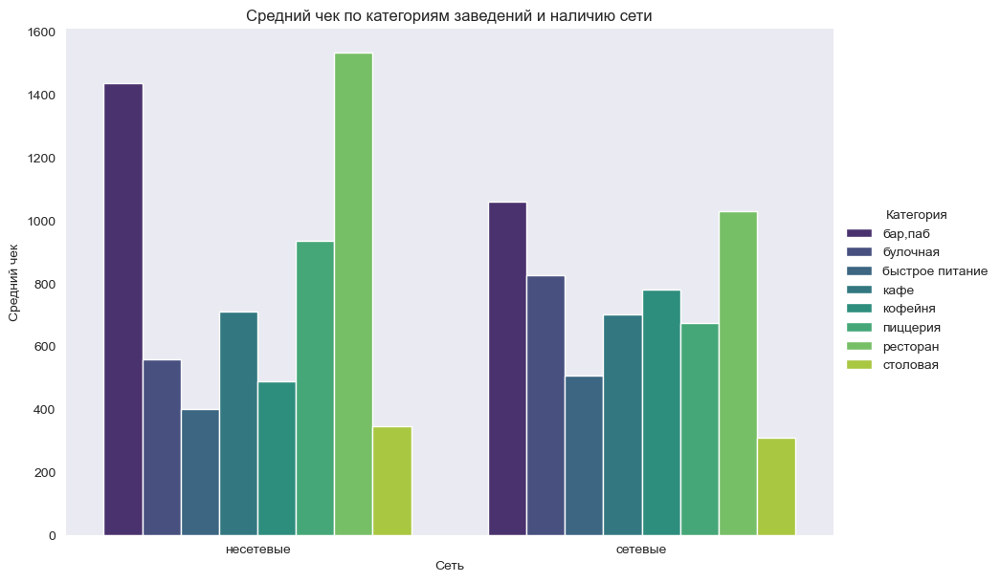

In [41]:
# Создадим сводную таблицу с данными о среднем чеке по категориям 
# с разделением на сетевые/несетевые 

bill_data_pivot=bill_data.query('middle_avg_bill>0')\
                         .pivot_table(index=['category', 'chain'], values='middle_avg_bill', aggfunc='mean')\
.reset_index()\
.rename(columns={'chain': 'Сеть', 'category': 'Категория', 'middle_avg_bill':'Средний чек'})
bill_data_pivot['Сеть'] = bill_data_pivot['Сеть'].replace({0: 'несетевые', 1: 'сетевые'})

# Построим диаграмму
sns.set_style('dark')
sns.catplot(data=bill_data_pivot, x='Сеть', y='Средний чек', hue='Категория', kind='bar',\
            height=6, aspect=1.5, palette="viridis")
plt.title('Средний чек по категориям заведений и наличию сети')
plt.show()

Представленная диаграмма иллюстрирует, что самые большие средние чеки в заведениях категорий "бар, паб" и "ресторан". Данная тенденция характерна как в сетевых заведениях, так и в несетевых.

In [42]:
# Проверим какие данные содержатся в столбце middle_avg_bill. Используем значения только больше ноля.
mid_bill = data.query('middle_avg_bill>0')
mid_bill['middle_avg_bill'].describe()

count     3148.000000
mean       958.358005
std       1009.748800
min         30.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

Исходя из полученных данных в столбце имеются данные значительно превышающие среднее значение (например, средний чек на 35 000 руб.). Данное значение является выбросом. Для более детального исследования исключим все значения больше 3 000 руб. и построим график рассеяния.

In [43]:
data_scatter = data.query('middle_avg_bill < 3000')
data_scatter = data_scatter.rename(columns={'category': 'Категория'})

fig = px.scatter(data_scatter, x='rating', y='middle_avg_bill', color='Категория',
                 color_discrete_sequence=px.colors.sequential.Viridis,
                 title='График соотношения среднего чека и рейтинга заведений (по категориям)')

fig.update_traces(marker=dict(size=10), opacity=0.5)

fig.update_layout(xaxis_title='Рейтинг заведений',
                  yaxis_title='Средний чек')


График иллюстрирует наличие зависимости размера среднего чека и рейтинга заведения. Данная тенденция характерна для всех категорий заведений. Исключение составляет незначительно количество кафе и ресторанов с низкими рейтингами (меньше 4) и большими средними чека. Очевидно, что в заведениях с хорошими рейтингами посетители делают заказ на большую сумму.

<a id='part-3-7'></a>
### 3.7. Иследование режима работы заведений 
[содержание](#part-0)

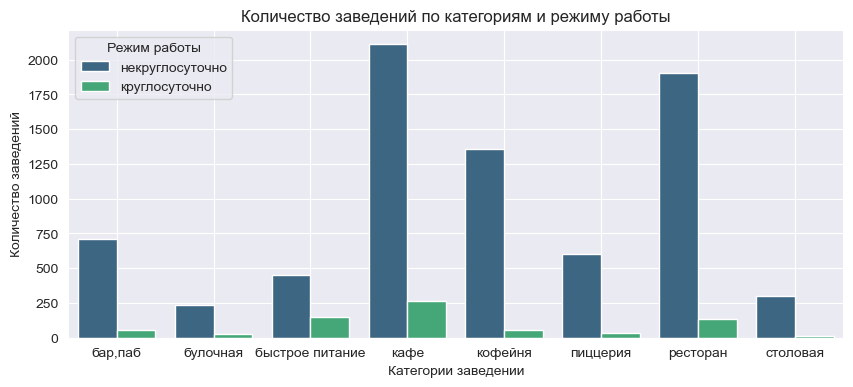

In [44]:
# Создадим таблицу с данными количестве заведений по категориям с разделением по режиму работы
category_all_day= data.groupby(['category', 'is_24/7'], \
                        as_index = False)[['name']].count()
category_all_day['is_24/7'] = category_all_day['is_24/7'].replace({True: 'круглосуточно', False: 'некруглосуточно'})

# Построим диаграмму
sns.set_style('dark')
plt.figure(figsize=(10, 4))
sns.barplot(x='category', y='name', data=category_all_day, hue='is_24/7', palette='viridis')
plt.title('Количество заведений по категориям и режиму работы')
plt.xlabel('Категории заведении')
plt.ylabel('Количество заведений')
plt.grid()
plt.legend(title='Режим работы')

plt.show()

Преимущественная часть заведений во всех категориях не являются круглосуточными заведениями. Из всех категорий  больше круглосуточных заведений представлено в категориях "кафе" и "быстрое питание".

<a id='part-3-8'></a>
### 3.8. Исследование категорий цен заведений 
[содержание](#part-0)

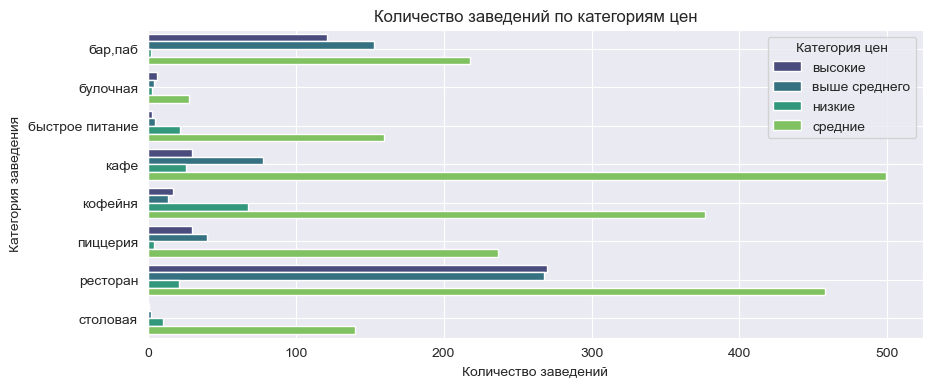

In [45]:
# Создадим таблицу с данными о количестве заведений по категориям в зависимости от категорий цен
category_price= data.query('price != "нет данных"').groupby(['category', 'price'], \
                        as_index = False)[['name']].count()
# Построим диаграмму
sns.set_style('dark')
plt.figure(figsize=(10, 4))
sns.barplot(y='category', x='name', data=category_price, hue='price', palette='viridis')
plt.title('Количество заведений по категориям цен')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведения')
plt.legend(title='Категория цен')
plt.grid()
plt.show()

Во всех категориях преобладают цены категории "средние". Цены категории "высокие" и "выше среднего" характерны для ресторанов и пабов. Больше всего низких цен представлено в категории заведений "кофейня".

**ВЫВОД**: На рынке общественного питания г. Москвы больше всего представлено заведений категорий "кафе" и "ресторан". Наибольший средний чек имеют заведения категории "бар, паб" и "ресторан". Из всех категорий заведений больше всего круглосуточно работают кафе, рестораны, бары.  
Самый многочисленным по количеству заведений общепита является Центральный АО. В этом же районе расположены заведения в наибольшим рейтингом и большим средним чеком.  Количество заведений уменьшается с отдалением от центра.   
Большая часть заведений являются несетевыми. Однако, сетевые заведения приобладают в Центральном и Западном АО.   


<a id='part-4'></a>
## 4. Исследование рынка кофеен г. Москвы 
[содержание](#part-0)

In [46]:
print('В датасете представлено', len(data[data['category']=='кофейня']), 'кофеен')

В датасете представлено 1413 кофеен


In [47]:
# Создадим таблицу с данными о количестве кофеен в районах
coffee_data = data.query('category == "кофейня"')
coffee_by_district = coffee_data.groupby('district').agg({'name':'count'}).reset_index()\
.sort_values(by='name', ascending=False)
coffee_by_district

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


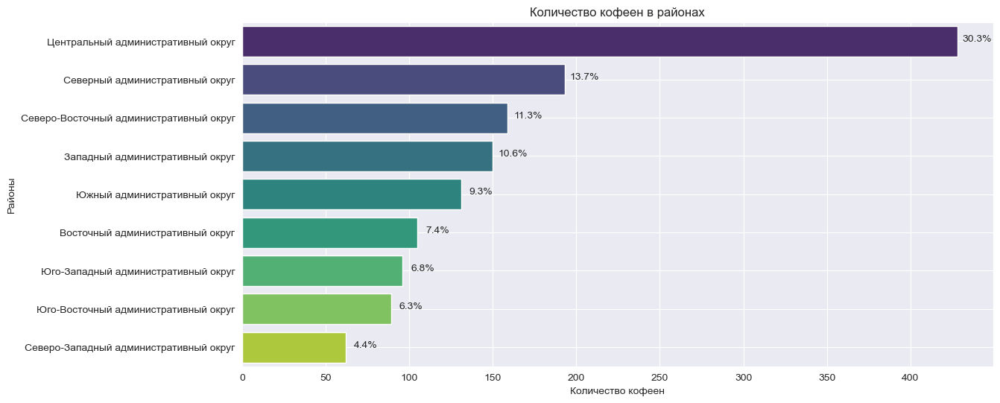

In [48]:
# Построим диаграмму 
sns.set_style('dark')
plt.figure(figsize=(13, 6))
ax = sns.barplot(x='name', y='district', data=coffee_by_district, palette='viridis')
plt.title('Количество кофеен в районах')
plt.xlabel('Количество кофеен')
plt.ylabel('Районы')
plt.grid()
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_width()/coffee_by_district['name'].sum())
    x = p.get_x() + p.get_width() + 12
    y = p.get_y() + p.get_height() / 2
    ax.text(x, y, percentage, ha="center")

plt.show()

Больше всего кофеен (30%) расположено в Центральном АО. Также более чем по 100 кофеен расположены в Северном, Северо-Восточном, Западном и Южном округах.

In [49]:
# Отобразим все кофейни датасета на карте с помощью кластеров.
# создаём карту Москвы
coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(coffee)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_data.apply(create_clusters, axis=1)

# выводим карту
coffee

Больше всего кофеен расположено в Центральном АО. Количество кофеен уменьшается по мере отдаления от центра города.

In [50]:
coffee_all_day = coffee_data.loc[((coffee_data['is_24/7'] == True))]
print(len(coffee_all_day), 'кофеен работают круглосуточно')

59 кофеен работают круглосуточно


In [51]:
# Создадим таблицу с количеством круглосуточных кофеен по районам
coffee_all_day_by_district = coffee_all_day.groupby('district').agg({'name':'count'}).reset_index()\
.sort_values(by='name', ascending=False)
coffee_all_day_by_district

,district,name
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


Большая часть круглосуточных кофеен расположены в Центральном АО. В остальных районах спрос на круглосуточные кофейни незначительный (не превышает 10 шт. на район).

In [52]:
# Проверим как рапределяются категории у самой крупной сети заведений "Шоколадница"
data.query('name == "шоколадница"').groupby('category').agg({'name':'count'}).reset_index()

,category,name
0,кафе,1
1,кофейня,119


Очевидно, что "Шоколадница" является сетью кофеен. Одно заведение этой сети с категорией "кафе" указано ошибочно.

In [53]:
# Создадим таблицу с данными о среднем рейтинге кофеен по районам
coffee_rating = coffee_data['rating'].mean()
coffee_rating = coffee_data.groupby('district').agg({'rating':'mean'}).round(2).reset_index()\
.sort_values(by='rating', ascending=False)
# строим столбчатую диаграмму
fig = px.bar(coffee_rating.sort_values(by='rating', ascending=True),
             x='rating',
             y='district', 
             text='rating',
             color_discrete_sequence=['#3f4788'],
)
fig.update_layout(title='Средний рейтинг кофеен по районам',
                  xaxis_title='Район', 
                  yaxis_title='Средний рейтинг')
fig.show()

Лучший рейтинг (4.34) в Центральном АО. В целом рейтинг кофеен в разных районых не сильно различается и колеблится от 4.20 до 4.34.

In [54]:
# Рассчитаем среднюю стоимость чашки капучино в кофейнях по районам
coffee_price = coffee_data.query('middle_coffee_cup > 0')
coffee_price_by_district = coffee_price.groupby('district').agg({'middle_coffee_cup':'mean'}).reset_index()\
.sort_values(by='middle_coffee_cup', ascending=False)
coffee_price_by_district['middle_coffee_cup'] = coffee_price_by_district['middle_coffee_cup'].round()

# Создадим хороплет с данными о средней стоимости чашки капучино
coffee_cup = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=coffee_price_by_district,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Средняя стоимость чашки капучино в районе, руб.',
).add_to(coffee_cup)

# выводим карту
coffee_cup

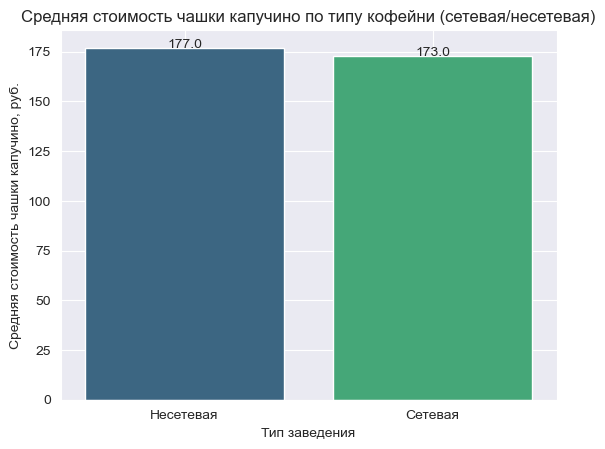

In [55]:
# Создадим таблицу с данными о средней стоимости часшки капучино в сетевых/несетевых кофейнях
coffee_price_by_chain = coffee_price.groupby('chain').agg({'middle_coffee_cup':'mean'}).reset_index()\
.sort_values(by='middle_coffee_cup', ascending=False)
coffee_price_by_chain['middle_coffee_cup'] = coffee_price_by_chain['middle_coffee_cup'].round()

# Построим диаграмму 
sns.set_style('dark')
ax = sns.barplot(x='chain', y='middle_coffee_cup', data=coffee_price_by_chain, palette='viridis')
plt.title('Средняя стоимость чашки капучино по типу кофейни (сетевая/несетевая)')
plt.xlabel('Тип заведения')
plt.ylabel('Средняя стоимость чашки капучино, руб.')
plt.grid()

for i, p in enumerate(ax.patches):
    ax.text(p.get_x() + p.get_width() / 2, p.get_height() + 0.1, coffee_price_by_chain['middle_coffee_cup'][i],
            ha='center', fontsize=10)
ax.set_xticklabels(['Несетевая', 'Сетевая'])

plt.show()

Средняя стоимость чашки капучино колеблется от 151 руб. (в Юго-Восточном АО) до 191 руб. (в Центральном АО). Разница между средней стоимость чашки капучино в сетевых и несетевых кофейнях незначительна (составляет 4 руб.).

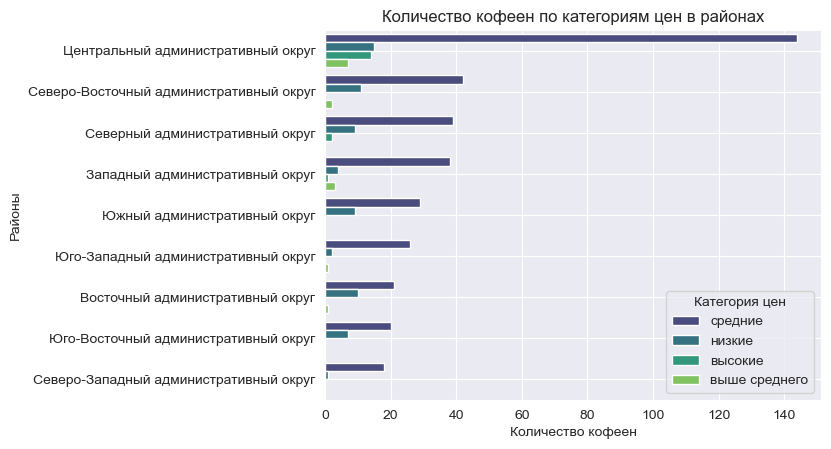

In [56]:
# Создадим таблицу с данными о категориях цен кофеен в разных районах
cafe_data_price= coffee_data.query('price != "нет данных"').groupby(['district', 'price'], \
                        as_index = False)[['name']].count()\
.sort_values(by='name', ascending=False)

# Построим диаграмму
sns.set_style('dark')
sns.barplot(x='name', y='district', data=cafe_data_price, hue='price', palette='viridis')
plt.title('Количество кофеен по категориям цен в районах')
plt.xlabel('Количество кофеен')
plt.ylabel('Районы')
plt.legend(loc='lower right', title='Категория цен')
plt.grid()
plt.show()


Во всех районах преобладаю кофейни среднего ценового сигмента. В Северо-Западном, Южном и Юго-Восточном округах отсутствуют кофейни с высокими и выше среднего категориями цен. Кофейни с низкими ценами больше всего представлены в Центральном районе. В данном районе также по сравнению с другими районами больше кофеен с категориями цен "высокие" и "выше среднего".  

**ВЫВОД**: На рынке Москвы представлено 1413 кофеен (в т.ч. 59 работают круглосуточно), 30% из которых расположены в Центральном АО. В данном районе расположено больше кофеен с наилучшим рейтингом.    
Средняя цена за чашку капучино колеблится от 151 руб. (в Юго-Восточном АО) до 191 руб. (в Центральном АО). Данная стоимость не сильно отличается в зависимости от типа кофейни.   
Во всех районах города больше всего представлено кофеен среднего ценового сегмента.

<a id='part-4'></a>
## 5. Общие выводы. 
[содержание](#part-0)

1. В рамках настоящего проекта проанализированы данные о 8406 заведениях общественного питания г. Москвы (по состоянию на лето 2022 г.).

В ходе подготовки данных были выполнены следующие действия:
- исключены три строки с дубликатами;
- пропущенные данные в столбцах 'hours', 'price', 'avg_bill' заменены на маркер "нет данных", а в столбцах 'middle_avg_bill', 'middle_coffee_cup', 'seats' - на ноль;
- в столбце 'seats' изменен тип данных с float64 на int64;
- добавлены новые столбцы с данными: об улицах, на которых расположены заведения; о круглосуточном режиме работы;  - исправлены ошибки в части значений столбца chain  для заведений, представленных в единственном числе.

2. **Основные результаты исследования**:    

* На рынке общественного питания г. Москвы **больше всего представлено заведений категорий "кафе" (28,3%) и "ресторан" (26,7%)**. Наибольший средний чек имеют заведения категории "бар, паб" и "ресторан". Из всех категорий больше всего круглосуточно работают кафе, рестораны, бары.   
* **Самый многочисленным по количеству заведений общепита является Центральный АО**. На данный район приходится 26,7% (2242 шт.) от всех заведений. Это может объясняться тем, что в данном районе большое количество деловых центров, офисных учреждений, развлекательных мест, туристических достопримечательностей, что обеспечивает большой поток посетителей, и как следствие большой строс на места общественного питания. В этом же районе расположены заведения в наибольшим рейтингом и большим средним чеком. В результате исследования установлено, что по мере территориального удаления от центра города количество заведений, их рейтинг и значение среднего чека уменьшаются.   
* Большая часть заведений на рынке **являются несетевыми**. Однако, сетевые заведения приобладают в Центральном и Западном АО, т.е. в районах с повышенным спросом на места общественного питания.     
* В результате анализе **выявлено наличие зависимости размера среднего чека и рейтинга заведения**. Данная тенденция характерна для всех категорий заведений. Очевидно, что в заведениях с хорошими рейтингами посетители делают заказ на большую сумму.    
 

3. **Результаты исследования рынка кофеен**:   
* Кофейни занимают третье место в рейтинге заведений Москвы по количеству, представлены на рынке 1413 кофейнями (большая часть из которых расположена в Центральном АО).   
* В среднем на одну кофейну приходится около 80 посадочных мест, что обеспечивает имеющийся поток посетителей.   
* Самая многочисленная сеть заведений общественного питания является "Шоколадница" (представлена 120 заведеними) относится к категории "кофейня".   
* Круглосуточный режим работы не популярен в кофейнях (в таком режиме работают только 59 кофеен). Вероятно, это оубсловлено тем, что основным продуктом данной категории заведений является кофе, которое не популярно в вечернее и ночное время.    
* Средняя стоимость чашки капучино в зависимости от района колеблется от 151 руб. (в Юго-Восточном АО) до 191 руб. (в Центральном АО).    
* Для кофеен характерен средний ценовой сегмент (вне зависимости от района).   

4. **Рекомендации для открытия новой кофейни**:
* **Расположение**: лучше всего открыть кофейню в Центральном АО, где сосредоточено большое количество потенциальных клиентов и имеется повышенный спрос на места общественного питания. 
* **Стоимость самого востребованного напитка кофеен** - капучино рекомендуется установить в пределах 150-190 руб. за чашку (+ заложить повышение цен на расходные материалы (продукты, одноразовая посуда и пр.) на момент открытия кофейни).
* **Режим работы**: оптимальным вариантом будет обычный режим работы (например, с 7:30 до 22:00), что позволит обеспечить приток клиентов, желающих купить кофе перед началом рабочего дня, а также поужинать в конце дня. Круглосуточный режим работы не оправдан для кофеен. Предложенный режим работы по сравнению с круглосуточным режимом позволит снизить затраты на персонал и риски для бизнеса. 
* **Размер заведения**: до 80 посадочных мест (примерно 20 столов), что позволит обеспечить достаточное количество посадочных мест, чтобы удовлетворить имеющийся поток посетителей. 
* **Ценовая политика**: средний ценовой сегмент на основной ассортимент блюд и напитков. Однако, рекомендуется предусмотреть несколько позиций меню с популярными напитками,блюдами с низкой ценой. Необходимо учитывать, что в заведениях с хорошим рейтингом посетители делают заказ на большую сумму, поэтому можно предлагать не только кофейные напитки и десерты, а также и другие блюда (в т.ч. на завтраки и бизнес-ланчи, что будет особенно актуально для кофейни, расположенной в деловом центре города), это позволит увеличить средний чек заведения.
* **Тип заведения**: можно рассмотреть возможность открытия сетевой кофейни (например, популярная сеть кофеен "Шоколадница"), что позволит использовать уже готовую концепцию, иметь больше опыта в управлении бизнесом и выйти на рынок с уже узнаваемым брендом. 

**Ссылка на презентацию**: https://disk.yandex.ru/i/uSVJhST8_-IBTQ